In [9]:
using Pkg
Pkg.add("Plots")

   Resolving package versions...
   Installed JpegTurbo_jll ──────────────── v3.1.3+0
   Installed x265_jll ───────────────────── v4.1.0+0
   Installed GR_jll ─────────────────────── v0.73.18+0
   Installed LERC_jll ───────────────────── v4.0.1+0
   Installed libfdk_aac_jll ─────────────── v2.0.4+0
   Installed Libmount_jll ───────────────── v2.41.2+0
   Installed Opus_jll ───────────────────── v1.5.2+0
   Installed libdecor_jll ───────────────── v0.2.2+0
   Installed Xorg_xkbcomp_jll ───────────── v1.4.7+0
   Installed Grisu ──────────────────────── v1.0.2
   Installed Measures ───────────────────── v0.3.2
   Installed ConcurrentUtilities ────────── v2.5.0
   Installed RelocatableFolders ─────────── v1.0.1
   Installed Contour ────────────────────── v0.6.3
   Installed Xorg_xcb_util_wm_jll ───────── v0.4.2+0
   Installed Xorg_xcb_util_image_jll ────── v0.4.1+0
   Installed RecipesPipeline ────────────── v0.6.12
   Installed PlotUtils ──────────────────── v1.4.3
   Installed OpenSSL ──

In [1]:
using Random, Dates
timestamp = Dates.now()
seed = Int(floor(Dates.datetime2unix(timestamp)))
Random.seed!(seed)

TaskLocalRNG()

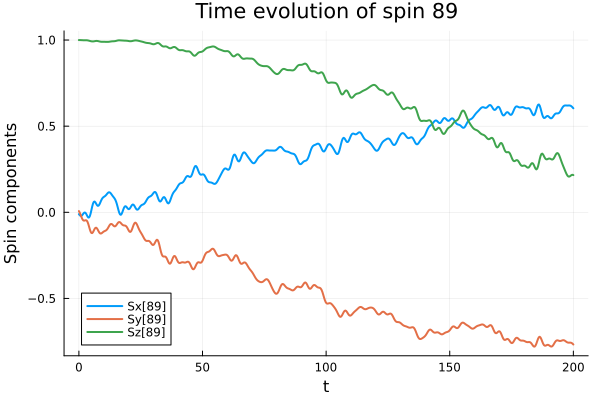

In [2]:
using DifferentialEquations
using LinearAlgebra
using Random

function heisenberg_chain!(dS, S, p, t)
    N, J = p

    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    # Periodic boundary conditions
    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field) ## Ferromagnetic coupling
    end
end


N = 200          
J = 1.0         
p = (N, J)
tspan = (0.0, 200.0)

"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
"""


#"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
#"""



# perturbation around inital state
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end


"""
## Random inital state
S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end
"""


S0_vec = vec(S0);  


prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p);
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6);

using Plots

ith_spin = 89

t = sol.t
S_i = [reshape(sol.u[k], (3, N))[:, ith_spin] for k in 1:length(sol)]
Sx = [s[1] for s in S_i]
Sy = [s[2] for s in S_i]
Sz = [s[3] for s in S_i]

# Plot components over time
plot(t, Sx, label="Sx[$ith_spin]", lw=2)
plot!(t, Sy, label="Sy[$ith_spin]", lw=2)
plot!(t, Sz, label="Sz[$ith_spin]", lw=2)
xlabel!("t")
ylabel!("Spin components")
title!("Time evolution of spin $ith_spin")

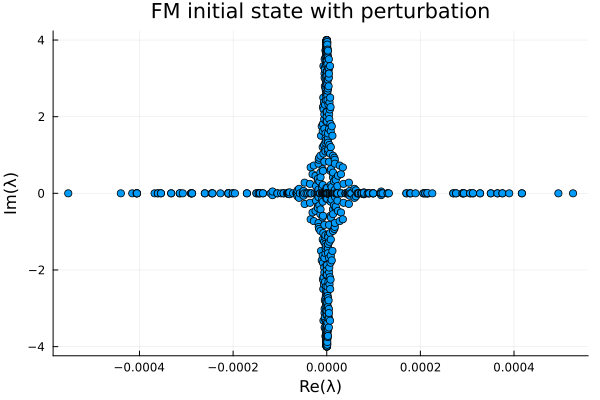

In [11]:
function jacobian_heisenberg(S0, N, J; δ=0.005)
    f0 = zeros(3N)
    heisenberg_chain!(f0, vec(S0), (N, J), 0.0)
    Jmat = zeros(3N, 3N)
    for j in 1:3N
        Spert = copy(vec(S0))
        Spert[j] += δ
        f1 = zeros(3N)
        heisenberg_chain!(f1, Spert, (N, J), 0.0)
        Jmat[:, j] .= (f1 - f0) / δ
    end
    return Jmat
end

function stability_analysis(S0, N, J)
    Jmat = jacobian_heisenberg(S0, N, J)
    eigs = eigvals(Jmat)
    max_real = maximum(real.(eigs))
    return eigs
end

eigs = stability_analysis(S0, N, J)

scatter(real.(eigs), imag.(eigs),
    xlabel="Re(λ)", ylabel="Im(λ)", title="FM initial state with perturbation",
    legend=false)

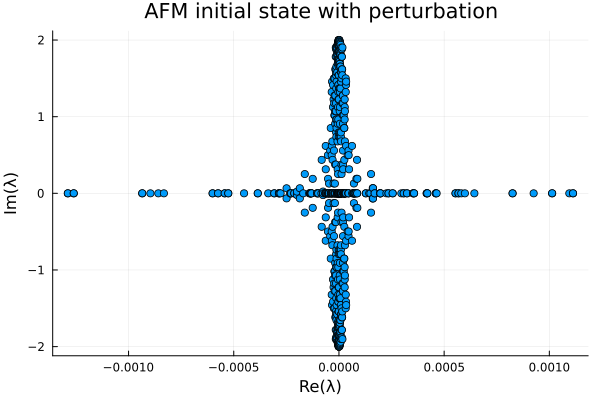

In [14]:
function jacobian_heisenberg(S0, N, J; δ=0.05)
    f0 = zeros(3N)
    heisenberg_chain!(f0, vec(S0), (N, J), 0.0)
    Jmat = zeros(3N, 3N)
    for j in 1:3N
        Spert = copy(vec(S0))
        Spert[j] += δ
        f1 = zeros(3N)
        heisenberg_chain!(f1, Spert, (N, J), 0.0)
        Jmat[:, j] .= (f1 - f0) / δ
    end
    return Jmat
end

function stability_analysis(S0, N, J)
    Jmat = jacobian_heisenberg(S0, N, J)
    eigs = eigvals(Jmat)
    max_real = maximum(real.(eigs))
    return eigs
end

eigs = stability_analysis(S0, N, J)

scatter(real.(eigs), imag.(eigs),
    xlabel="Re(λ)", ylabel="Im(λ)", title="AFM initial state with perturbation",
    legend=false)

## Lyapunov expoenents - Subroto Mukherjee

In [114]:
using DifferentialEquations, LinearAlgebra, Random

function lyapunov_exponents(N, J; T=100.0, dt=0.01, δ=1e-6)
    
    # --- AFM initial state ---
    S0 = zeros(3, N)
    for i in 1:N
        if isodd(i)
            S0[:, i] = [0.0, 0.0, 1.0]   
        else
            S0[:, i] = [0.0, 0.0, -1.0]  
        end
    end
    
    num_steps = Int(T / dt)
    dim = 3N

    # Allocate arrays (no longer 3×N indexing)
    deltax_ij = zeros(dim)
    lambda_ij = zeros(dim)
    S = copy(S0)

    for step in 1:num_steps
        prob = ODEProblem(heisenberg_chain, vec(S), (0.0, dt), (N, J))
        sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6)
        S = reshape(sol.u[end], (3, N))

        # Evolve perturbations
        δS = δ * randn(dim)  # Flattened perturbation
        S_pert = vec(S) .+ δS

        prob_pert = ODEProblem(heisenberg_chain, S_pert, (0.0, dt), (N, J))
        sol_pert = solve(prob_pert, Tsit5(), reltol=1e-6, abstol=1e-6)
        S_pert_final = sol_pert.u[end]

        # Compute deviation
        deltax_ij .= S_pert_final .- vec(S)

        # Compute Lyapunov "growth" per component
        lambda_ij .= log.(abs.(deltax_ij) ./ δ) ./ T
    end

    return lambda_ij
end

lyapunov_exponents (generic function with 2 methods)

In [115]:
lyapunov_exponents(100, 1.0)

300-element Vector{Float64}:
 -0.008401475926935641
 -0.011443820530730928
  0.004185751423931136
  0.004139089771893338
 -0.015958181638599134
 -0.003654034471489418
 -0.0302387245277685
  0.0023295545220806428
 -0.004815363031082845
 -0.014245101765409758
 -0.0056853399284029285
  0.004186495430988261
 -0.016165076159999524
  ⋮
 -0.0029228772936080215
 -0.028701111135703908
 -0.0027446504395319694
 -0.026933997147263487
  0.00013376226753114976
 -0.006995906042355705
 -0.0011645200683797938
 -0.00852550860505228
 -0.03023828225314443
 -0.02549527484221306
 -0.022331605541167244
 -0.006805464402441381

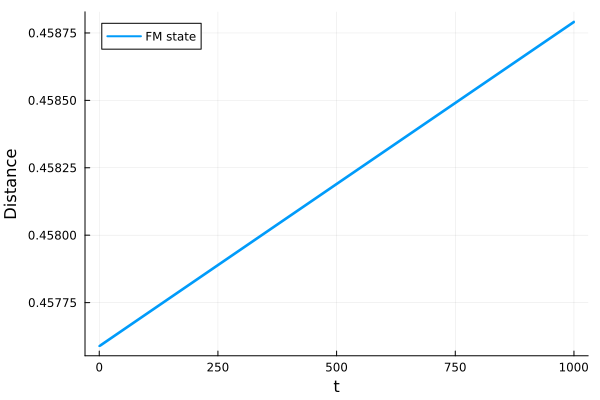

In [65]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

N = 1000
J = 1.0
p = (N, J)
tspan = (0.0, 1000.0)

#"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
#"""

"""
#AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]
    else
        S0[:, i] = [0.0, 0.0, -1.0]
    end
end
"""

"""
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])
end
"""

S0_vec = vec(S0)

δ = 0.01
S0_perturbed_vec = S0_vec .+ δ * randn(length(S0_vec))
for i in 1:N
    S0_perturbed_vec[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec[3*(i-1)+1:3*i])
end

prob1 = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
sol1 = solve(prob1, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

prob2 = ODEProblem(heisenberg_chain!, S0_perturbed_vec, tspan, p)
sol2 = solve(prob2, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)


distances = [norm(sol1(t) - sol2(t)) for t in sol1.t]


plot(sol1.t, distances, lw=2, label = "FM state")
xlabel!("t")
ylabel!("Distance")

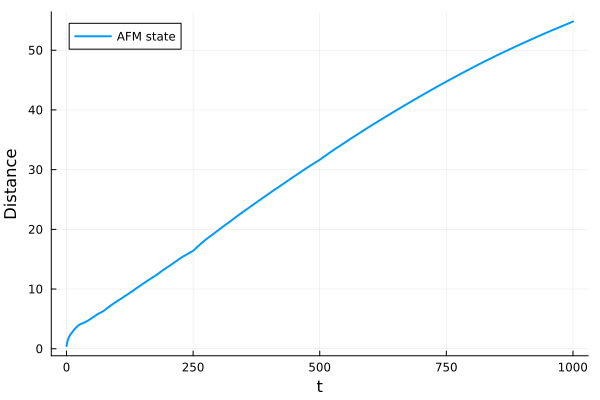

In [64]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

N = 1000
J = 1.0
p = (N, J)
tspan = (0.0, 1000.0)

"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
"""

#"""
#AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]
    else
        S0[:, i] = [0.0, 0.0, -1.0]
    end
end
#"""

"""
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])
end
"""

S0_vec = vec(S0)

δ = 0.01
S0_perturbed_vec = S0_vec .+ δ * randn(length(S0_vec))
for i in 1:N
    S0_perturbed_vec[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec[3*(i-1)+1:3*i])
end

prob1 = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
sol1 = solve(prob1, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

prob2 = ODEProblem(heisenberg_chain!, S0_perturbed_vec, tspan, p)
sol2 = solve(prob2, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)


distances = [norm(sol1(t) - sol2(t)) for t in sol1.t]


plot(sol1.t, distances, lw=2, label = "AFM state")
xlabel!("t")
ylabel!("Distance")

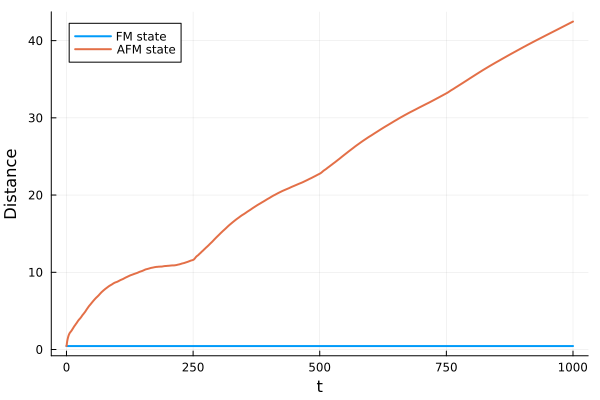

In [11]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

N = 1000
J = 1.0
p = (N, J)
tspan = (0.0, 1000.0)

#"""
# Ferromagnetic initial state
S0_fm = [0.0  for i in 1:N, j in 1:3]'
S0_fm[3, :] .= 1.0  
#"""

#"""
#AFM initial state
S0_afm = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0_afm[:, i] = [0.0, 0.0, 1.0]
    else
        S0_afm[:, i] = [0.0, 0.0, -1.0]
    end
end
#"""

"""
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])
end
"""

S0_vec_fm = vec(S0_fm)
S0_vec_afm = vec(S0_afm)

δ = 0.01
S0_perturbed_vec_fm = S0_vec_fm .+ δ * randn(length(S0_vec_fm))
for i in 1:N
    S0_perturbed_vec_fm[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec_fm[3*(i-1)+1:3*i])
end

S0_perturbed_vec_afm = S0_vec_afm .+ δ * randn(length(S0_vec_afm))
for i in 1:N
    S0_perturbed_vec_afm[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec_afm[3*(i-1)+1:3*i])
end

probfm = ODEProblem(heisenberg_chain!, S0_vec_fm, tspan, p)
solfm = solve(probfm, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probafm = ODEProblem(heisenberg_chain!, S0_vec_afm, tspan, p)
solafm = solve(probafm, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probfmp = ODEProblem(heisenberg_chain!, S0_perturbed_vec_fm, tspan, p)
solfmp = solve(probfmp, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probafmp = ODEProblem(heisenberg_chain!, S0_perturbed_vec_afm, tspan, p)
solafmp = solve(probafmp, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)


distancesfm = [norm(solfm(t) - solfmp(t)) for t in solfm.t]
distancesafm = [norm(solafm(t) - solafmp(t)) for t in solafm.t]

plot(solfm.t, distancesfm, lw=2, label = "FM state")
plot!(solafm.t, distancesafm, lw=2, label = "AFM state")
xlabel!("t")
ylabel!("Distance")

In [68]:
function unit_vector()
    v = zeros(3)
    θ = rand() * 2π
    ϕ = rand() * π

    v[1] = cos(θ) * sin(ϕ)
    v[2] = sin(θ) * sin(ϕ)
    v[3] = cos(ϕ)
    return v
end

unit_vector (generic function with 1 method)

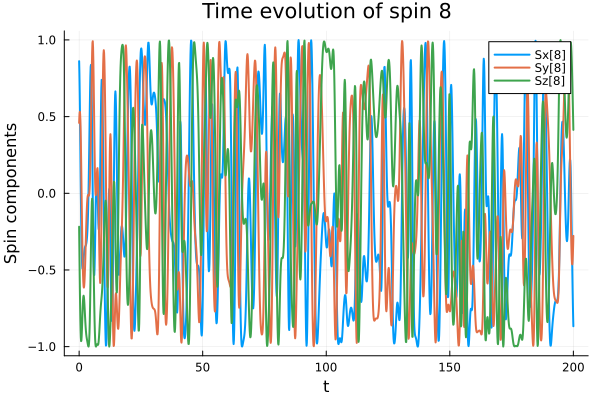

In [ ]:
using DifferentialEquations
using LinearAlgebra
using Random

function heisenberg_chain!(dS, S, p, t)
    N, J = p

    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    # Periodic boundary conditions
    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field) ## Ferromagnetic coupling
    end
end


N = 200          
J = 1.0         
p = (N, J)
tspan = (0.0, 200.0)

"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
"""


"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
"""

"""
# angle state = random state
S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = unit_vector()
end
"""

function angle_v(i)
    ϕ = i * rand() * 2π

    v = [cos(ϕ), sin(ϕ), 0.0]
    return v
end

S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = angle_v(i)
end

# perturbation around inital state
ϵ = 0.0
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end


"""
## Random inital state
S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end
"""


S0_vec = vec(S0);  


prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p);
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6);

using Plots

ith_spin = 8

t = sol.t
S_i = [reshape(sol.u[k], (3, N))[:, ith_spin] for k in 1:length(sol)]
Sx = [s[1] for s in S_i]
Sy = [s[2] for s in S_i]
Sz = [s[3] for s in S_i]

# Plot components over time
plot(t, Sx, label="Sx[$ith_spin]", lw=2)
plot!(t, Sy, label="Sy[$ith_spin]", lw=2)
plot!(t, Sz, label="Sz[$ith_spin]", lw=2)
xlabel!("t")
ylabel!("Spin components")
title!("Time evolution of spin $ith_spin")

In [80]:
function angle_v(i)
    ϕ = i * rand() * 2π

    v = [cos(ϕ), sin(ϕ), 0.0]
    return v
end

angle_v (generic function with 2 methods)

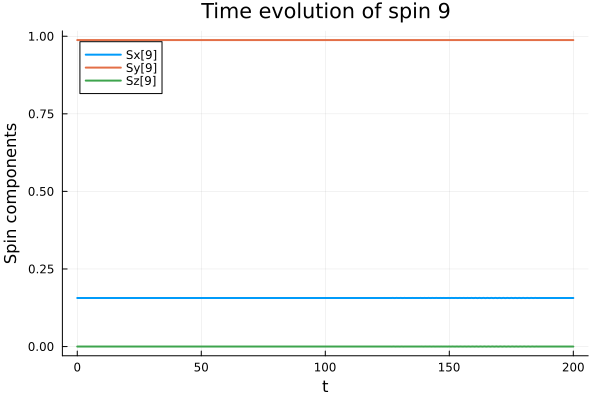

In [8]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p

    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    # Periodic boundary conditions
    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field) ## Ferromagnetic coupling
    end
end


N = 200          
J = 1.0         
p = (N, J)
tspan = (0.0, 200.0)

"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
"""


"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
"""

"""
# angle state = random state
S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = unit_vector()
end
"""

ϕ = π/20
function angle_v(i)
    [cos(i * ϕ), sin(i * ϕ), 0.0]
end

S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = angle_v(i)
end


# perturbation around inital state
ϵ = 0.0
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end


"""
## Random inital state
S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end
"""


S0_vec = vec(S0);  


prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p);
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6);

using Plots

ith_spin = 9

t = sol.t
S_i = [reshape(sol.u[k], (3, N))[:, ith_spin] for k in 1:length(sol)]
Sx = [s[1] for s in S_i]
Sy = [s[2] for s in S_i]
Sz = [s[3] for s in S_i]

# Plot components over time
plot(t, Sx, label="Sx[$ith_spin]", lw=2)
plot!(t, Sy, label="Sy[$ith_spin]", lw=2)
plot!(t, Sz, label="Sz[$ith_spin]", lw=2)
xlabel!("t")
ylabel!("Spin components")
title!("Time evolution of spin $ith_spin")

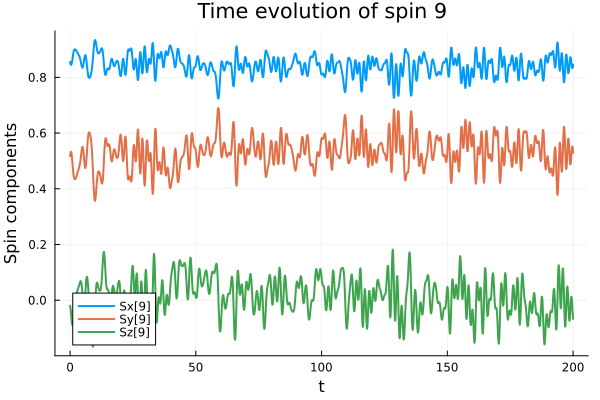

In [19]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p

    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    # Periodic boundary conditions
    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field) ## Ferromagnetic coupling
    end
end


N = 200          
J = 1.0         
p = (N, J)
tspan = (0.0, 200.0)

"""
# Ferromagnetic initial state
S0 = [0.0  for i in 1:N, j in 1:3]'
S0[3, :] .= 1.0  
"""


"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
"""

"""
# angle state = random state
S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = unit_vector()
end
"""

#ϕ = rand() * 2π
ϕ = π/50
function angle_v(i)
    [cos(i * ϕ), sin(i * ϕ), 0.0]
end

S0 = zeros(3, N)
for i in 1:N
    S0[:, i] = angle_v(i)
end


# perturbation around inital state
ϵ = 0.07
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end


"""
## Random inital state
S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end
"""


S0_vec = vec(S0);  


prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p);
sol = solve(prob, Tsit5(), reltol=1e-6, abstol=1e-6);

using Plots

ith_spin = 9

t = sol.t
S_i = [reshape(sol.u[k], (3, N))[:, ith_spin] for k in 1:length(sol)]
Sx = [s[1] for s in S_i]
Sy = [s[2] for s in S_i]
Sz = [s[3] for s in S_i]

# Plot components over time
plot(t, Sx, label="Sx[$ith_spin]", lw=2)
plot!(t, Sy, label="Sy[$ith_spin]", lw=2)
plot!(t, Sz, label="Sz[$ith_spin]", lw=2)
xlabel!("t")
ylabel!("Spin components")
title!("Time evolution of spin $ith_spin")

In [100]:
N = 4
function angle_v(i)
    v = [cos(i*ϕ), sin(i*ϕ), 0.0]
    return v
end

S0 = zeros(3, N);
ϕ = rand() * 2π
for i in 1:N
    S0[:, i] = angle_v(i)
end

norm(S0[:, 3])

0.9999999999999999

Step 1 — Fidelity = 0.00353, Distance = 19.964652
Step 2 — Fidelity = -0.024535, Distance = 20.243827
Step 3 — Fidelity = -0.003544, Distance = 20.035355
Step 4 — Fidelity = 0.020881, Distance = 19.790013
Step 5 — Fidelity = -0.055501, Distance = 20.547498
Step 6 — Fidelity = 0.055865, Distance = 19.433286
Step 7 — Fidelity = -0.061982, Distance = 20.610451
Step 8 — Fidelity = 0.128149, Distance = 18.674524
Step 9 — Fidelity = -0.069391, Distance = 20.682254
Step 10 — Fidelity = -0.02254, Distance = 20.224112
Step 11 — Fidelity = -0.03885, Distance = 20.384754
Step 12 — Fidelity = 0.025417, Distance = 19.744142
Step 13 — Fidelity = -0.050505, Distance = 20.498816
Step 14 — Fidelity = 0.087913, Distance = 19.100625
Step 15 — Fidelity = 0.134622, Distance = 18.605125
Step 16 — Fidelity = 0.001671, Distance = 19.983263
Step 17 — Fidelity = 0.354595, Distance = 16.067405
Step 18 — Fidelity = 0.206749, Distance = 17.81291
Step 19 — Fidelity = -0.382152, Distance = 23.51299
Step 20 — Fidelit

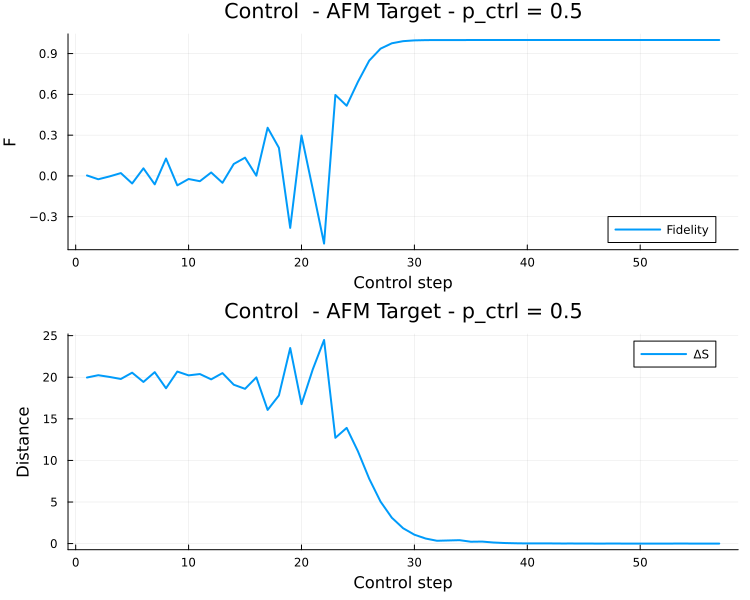

([0.0035299369979083207, -0.02453478599913739, -0.0035438445078721675, 0.020881471510643002, -0.05550079457445527, 0.05586525586461248, -0.061981564788128544, 0.12814887522192323, -0.06939050317224114, -0.022539533768263068  …  0.9999999661265739, 0.9999999882840892, 0.9999999874960462, 0.9999999866636005, 0.9999999860731039, 0.9999999854354426, 0.9999999853126949, 0.9999999885554753, 0.9999999882487994, 0.9999999947041034], [19.9646520994041, 20.243826753325564, 20.035354837349473, 19.790012938123628, 20.547497850800216, 19.4332858228556, 20.610450833866672, 18.674524061687755, 20.682254378664894, 20.224111994119628  …  0.0042178367365148595, 0.0024497141286750103, 0.002818744390921694, 0.0031872165065008934, 0.0035348627031074717, 0.003878572123315966, 0.00418972053133591, 0.0025155668061986177, 0.002905563943453335, 0.001892909088184378])

In [ ]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S, p_ctrl)
    S_proj = projector_afm_full(S)
    newS = (1 - p_ctrl) .* S .+ p_ctrl .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end



N = 200
J = 1.0


S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end


S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.5; T = 100.0, dt = 0.1, max_steps = 500)


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, J)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end

        
        if rand() < p_ctrl
            S_final = projector_afm_half(S_final, p_ctrl)
        end

        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end

Step 1 — Fidelity = 0.908571, Distance = 6.047445
Step 2 — Fidelity = 0.6525, Distance = 11.78983
Step 3 — Fidelity = 0.27802, Distance = 16.993882
Step 4 — Fidelity = -0.146717, Distance = 21.416981
Step 5 — Fidelity = -0.545036, Distance = 24.8599
Step 6 — Fidelity = -0.84434, Distance = 27.161297
Step 7 — Fidelity = -0.990159, Distance = 28.214601
Step 8 — Fidelity = -0.955938, Distance = 27.970975
Step 9 — Fidelity = -0.748147, Distance = 26.443501
Step 10 — Fidelity = -0.404274, Distance = 23.700416
Step 11 — Fidelity = 0.012927, Distance = 19.870313
Step 12 — Fidelity = 0.427922, Distance = 15.127174
Step 13 — Fidelity = 0.765053, Distance = 9.694283
Step 14 — Fidelity = 0.963229, Distance = 3.835182
Step 15 — Fidelity = 0.986368, Distance = 2.335168
Step 16 — Fidelity = 0.830358, Distance = 8.237541
Step 17 — Fidelity = 0.52339, Distance = 13.807401
Step 18 — Fidelity = 0.121394, Distance = 18.746803
Step 19 — Fidelity = -0.302671, Distance = 22.826926
Step 20 — Fidelity = -0.67

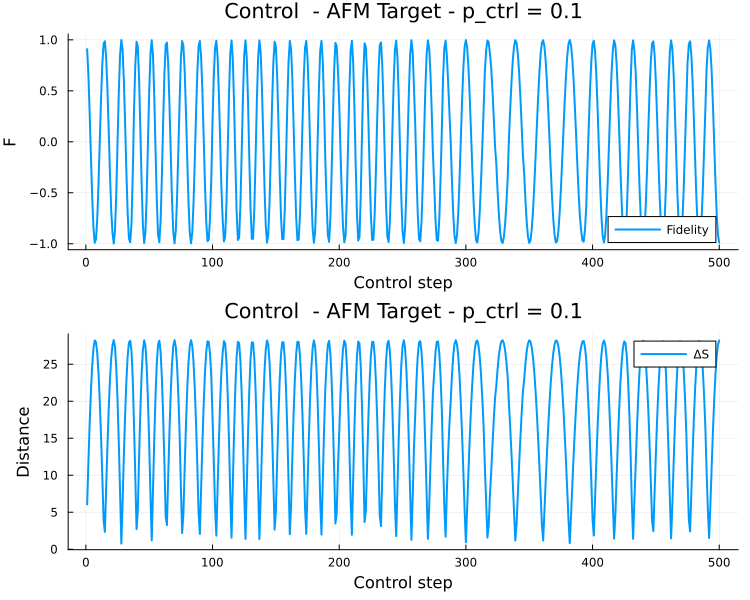

([0.9085710568412027, 0.6524998464746894, 0.27802005501775173, -0.14671748645353605, -0.5450363688617659, -0.8443398960192079, -0.9901590051767891, -0.9559383547696987, -0.7481465598372271, -0.40427395691048823  …  0.9237781823914726, 0.9943275498653094, 0.9147949285717445, 0.6972116036242766, 0.3745578676855925, -0.004460023582140697, -0.38250492853708484, -0.7024921973519842, -0.9159472439199716, -0.9883429107938695], [6.047444875331296, 11.789829985590215, 16.99388200527661, 21.416980548993603, 24.859899950300658, 27.1612969860855, 28.21460103224385, 27.97097536266724, 26.443501300043067, 23.700416431399184  …  5.521662934208557, 1.5063289798531418, 5.837986755705429, 11.005245961062968, 15.81698306924132, 20.04455351202237, 23.515996738813524, 26.0959197573162, 27.683552199614418, 28.20172294852254])

In [17]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S, p_ctrl)
    S_proj = projector_afm_full(S)
    newS = (1 - p_ctrl) .* S .+ p_ctrl .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, J)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end

        
        if rand() < p_ctrl
            S_final = projector_afm_half(S_final, p_ctrl)
        else
            S_final = S_final
        end

        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
J = 1.0


#"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
#"""

# perturbation around inital state
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end

S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.1; T = 100.0, dt = 0.1, max_steps = 500)

Step 1 — Fidelity = -0.036544, Distance = 20.362147
Step 2 — Fidelity = 0.01821, Distance = 19.817029
Step 3 — Fidelity = 0.063831, Distance = 19.351106
Step 4 — Fidelity = 0.007351, Distance = 19.926283
Step 5 — Fidelity = 0.022167, Distance = 19.777
Step 6 — Fidelity = -0.024657, Distance = 20.244957
Step 7 — Fidelity = -0.001633, Distance = 20.016201
Step 8 — Fidelity = -0.071154, Distance = 20.699179
Step 9 — Fidelity = 0.039133, Distance = 19.604745
Step 10 — Fidelity = -0.018209, Distance = 20.181255
Step 11 — Fidelity = -0.042201, Distance = 20.417614
Step 12 — Fidelity = -0.023748, Distance = 20.236034
Step 13 — Fidelity = 0.038509, Distance = 19.611059
Step 14 — Fidelity = 0.027174, Distance = 19.726298
Step 15 — Fidelity = 0.024751, Distance = 19.750831
Step 16 — Fidelity = -0.118723, Distance = 21.15382
Step 17 — Fidelity = -0.085282, Distance = 20.835237
Step 18 — Fidelity = -0.027973, Distance = 20.277647
Step 19 — Fidelity = -0.0172, Distance = 20.171092
Step 20 — Fidelit

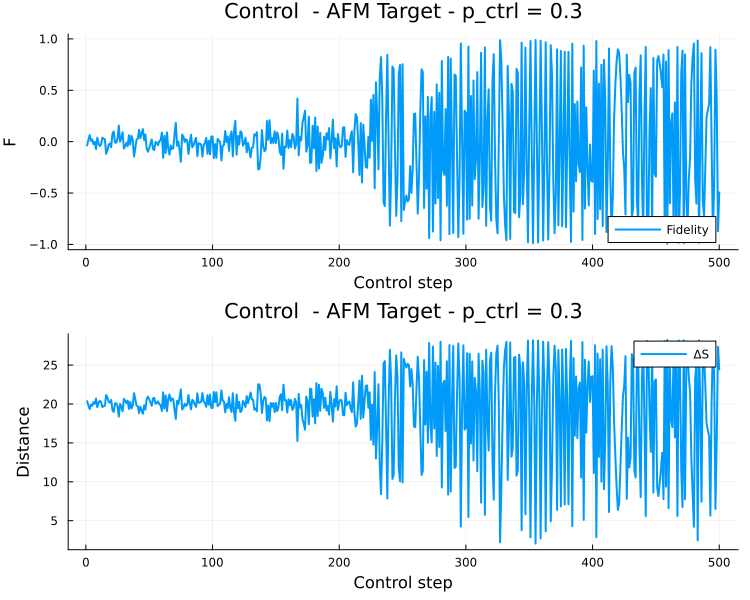

([-0.03654441602162449, 0.01820971274987511, 0.06383130987295393, 0.007350780445942408, 0.022166646804469118, -0.024656527304897, -0.001633287889207699, -0.07115428108902291, 0.03913322516673163, -0.018209418620594806  …  0.3073880223500467, 0.3705131107670887, 0.919932927846766, -0.039884993159599376, -0.9152222464161901, -0.40634992928101527, 0.8941497404157345, 0.4494483862496598, -0.8714368611229898, -0.49493069788611493], [20.362147308340827, 19.81702937788186, 19.35110613407039, 19.926283483574064, 19.7769999421562, 20.24495725116635, 20.016200906534404, 20.699178727106794, 19.604744738679162, 20.181255449314445  …  16.644662794155654, 15.868042355053369, 5.659226219953821, 20.39495086655621, 27.67831120601675, 23.71792568380435, 6.506930395157217, 14.839834877610466, 27.360095231199757, 24.45347338378713])

In [8]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S, p_ctrl)
    S_proj = projector_afm_full(S)
    newS = (1 - p_ctrl) .* S .+ p_ctrl .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, J)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-5
            break
        end

        
        if rand() < p_ctrl
            S_final = projector_afm_half(S_final, p_ctrl)
        end

        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
J = 1.0


S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end


S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.3; T = 100.0, dt = 0.1, max_steps = 500)


Step 1 — Fidelity = 0.970175, Distance = 3.454005
Step 2 — Fidelity = 0.882906, Distance = 6.843815
Step 3 — Fidelity = 0.743222, Distance = 10.134659
Step 4 — Fidelity = 0.559084, Distance = 13.280306
Step 5 — Fidelity = 0.341631, Distance = 16.227991
Step 6 — Fidelity = 0.103805, Distance = 18.933516
Step 7 — Fidelity = -0.139938, Distance = 21.353578
Step 8 — Fidelity = -0.375362, Distance = 23.455171
Step 9 — Fidelity = 0.373305, Distance = 15.832811
Step 10 — Fidelity = 0.171302, Distance = 18.206576
Step 11 — Fidelity = -0.038212, Distance = 20.378539
Step 12 — Fidelity = -0.246095, Distance = 22.325727
Step 13 — Fidelity = -0.443104, Distance = 24.025855
Step 14 — Fidelity = -0.62051, Distance = 25.45985
Step 15 — Fidelity = -0.770552, Distance = 26.612417
Step 16 — Fidelity = -0.88649, Distance = 27.469914
Step 17 — Fidelity = -0.963212, Distance = 28.022937
Step 18 — Fidelity = -0.997445, Distance = 28.266201
Step 19 — Fidelity = -0.987613, Distance = 28.196547
Step 20 — Fidel

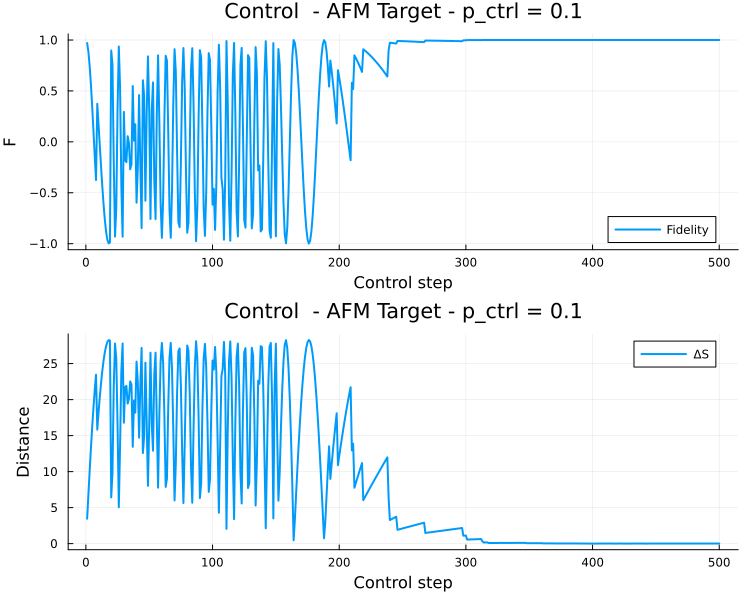

([0.9701746573978599, 0.8829055746736125, 0.7432218500544012, 0.55908388144872, 0.341631038672986, 0.10380518301453144, -0.1399379153226036, -0.37536221619757326, 0.3733052667744945, 0.17130157777989552  …  0.9999999294794936, 0.9999999359655647, 0.9999999322877012, 0.9999999402460414, 0.9999999288506158, 0.9999999393836021, 0.9999999263551211, 0.999999935730491, 0.9999999372261348, 0.9999999304317185], [3.4540048707977387, 6.843814710954746, 10.134658896730148, 13.280305817118771, 16.227990737125282, 18.933516455842796, 21.35357819424913, 23.45517092027403, 15.832811379836826, 18.206576072754824  …  0.012265900741723042, 0.012373946866071274, 0.012644626901847162, 0.01273100803102761, 0.013116726986149116, 0.013164063015501845, 0.013565132243253881, 0.013631072888712466, 0.013812263992283533, 0.014111585854408875])

In [28]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S)
    S_proj = projector_afm_full(S)
    newS = 0.5 .* S .+ 0.5 .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, J)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end
        if rand() < p_ctrl
                S_final = projector_afm_half(S_final)
            else
                S_final = S_final
        end
        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
J = 1.0


#"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
#"""

# perturbation around inital state
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end

S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.1; T = 100.0, dt = 0.1, max_steps = 500)

Step 1 — Fidelity = 1.0, Distance = 0.0


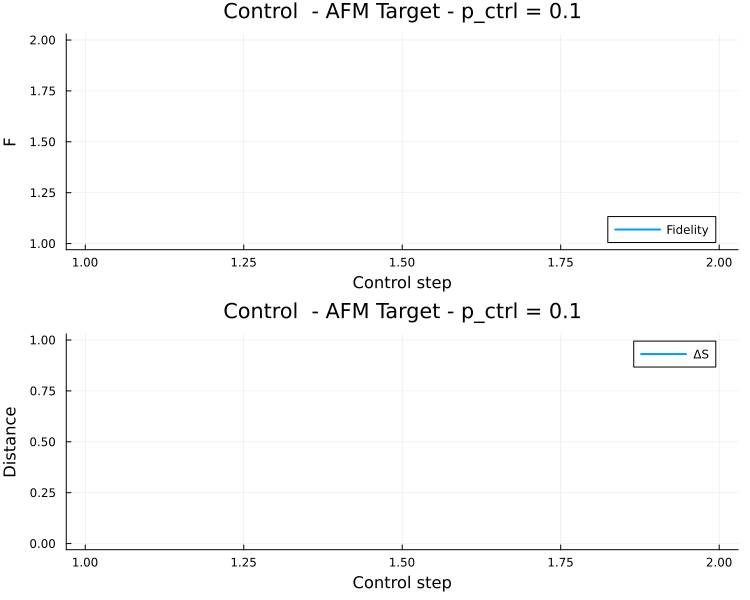

([1.0], [0.0])

In [36]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S)
    S_proj = projector_afm_full(S)
    newS = 0.7 .* S .+ 0.3 .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, J)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chain!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end
        if rand() < p_ctrl
                S_final = projector_afm_half(S_final)
            else
                S_final = S_final
        end
        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
J = 1.0


#"""
# AFM initial state
S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end
#"""

# perturbation around inital state
ϵ = 0.00
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])   
end

S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.1; T = 100.0, dt = 0.3, max_steps = 1000)

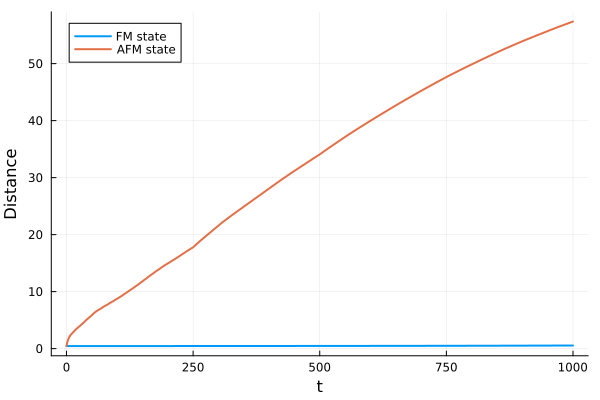

In [1]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i+1, N)
        im1 = mod1(i-1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

N = 1000
J = 1.0
p = (N, J)
tspan = (0.0, 1000.0)

"""
# Ferromagnetic initial state
S0_fm = [0.0  for i in 1:N, j in 1:3]'
S0_fm[3, :] .= 1.0  
"""

#"""
#AFM initial state
S0_afm = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0_afm[:, i] = [0.0, 0.0, 1.0]
    else
        S0_afm[:, i] = [0.0, 0.0, -1.0]
    end
end
#"""

#ϕ = rand() * 2π
ϕ = π/50
function angle_v(i)
    [cos(i * ϕ), sin(i * ϕ), 0.0]
end

S0_fm = zeros(3, N)
for i in 1:N
    S0_fm[:, i] = angle_v(i)
end

"""
ϵ = 1e-2
for i in 1:N
    S0[:, i] .+= ϵ * randn(3)
    S0[:, i] ./= norm(S0[:, i])
end
"""

S0_vec_fm = vec(S0_fm)
S0_vec_afm = vec(S0_afm)

δ = 0.01
S0_perturbed_vec_fm = S0_vec_fm .+ δ * randn(length(S0_vec_fm))
for i in 1:N
    S0_perturbed_vec_fm[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec_fm[3*(i-1)+1:3*i])
end

S0_perturbed_vec_afm = S0_vec_afm .+ δ * randn(length(S0_vec_afm))
for i in 1:N
    S0_perturbed_vec_afm[3*(i-1)+1:3*i] ./= norm(S0_perturbed_vec_afm[3*(i-1)+1:3*i])
end

probfm = ODEProblem(heisenberg_chain!, S0_vec_fm, tspan, p)
solfm = solve(probfm, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probafm = ODEProblem(heisenberg_chain!, S0_vec_afm, tspan, p)
solafm = solve(probafm, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probfmp = ODEProblem(heisenberg_chain!, S0_perturbed_vec_fm, tspan, p)
solfmp = solve(probfmp, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)

probafmp = ODEProblem(heisenberg_chain!, S0_perturbed_vec_afm, tspan, p)
solafmp = solve(probafmp, Tsit5(), reltol=1e-6, abstol=1e-6, saveat = 0.01)


distancesfm = [norm(solfm(t) - solfmp(t)) for t in solfm.t]
distancesafm = [norm(solafm(t) - solafmp(t)) for t in solafm.t]

plot(solfm.t, distancesfm, lw=2, label = "FM state")
plot!(solafm.t, distancesafm, lw=2, label = "AFM state")
xlabel!("t")
ylabel!("Distance")

In [2]:
function heisenberg_chaotic!(dS, S, p, t)
    N, Jx, Jy, Jz, h = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)

        neighbor_field = [
            Jx * (S_mat[1, im1] + S_mat[1, ip1]),
            Jy * (S_mat[2, im1] + S_mat[2, ip1]),
            Jz * (S_mat[3, im1] + S_mat[3, ip1])
        ]

        local_field = neighbor_field + h[i, :]

        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end


N = 100
Jx, Jy, Jz = 1.0, 0.9, 1.1  
h_strength = 0.1
h = h_strength .* randn(N, 3)

p = (N, Jx, Jy, Jz, h)
tspan = (0.0, 500.0)

(0.0, 500.0)

Step 1 — Fidelity = 0.00972, Distance = 19.902546
Step 2 — Fidelity = -0.028068, Distance = 20.278717
Step 3 — Fidelity = -0.045641, Distance = 20.451297
Step 4 — Fidelity = -0.0278, Distance = 20.276079
Step 5 — Fidelity = -0.007405, Distance = 20.073895
Step 6 — Fidelity = -0.01919, Distance = 20.190973
Step 7 — Fidelity = 0.053807, Distance = 19.454476
Step 8 — Fidelity = -0.062826, Distance = 20.618677
Step 9 — Fidelity = -0.011455, Distance = 20.114207
Step 10 — Fidelity = -0.053541, Distance = 20.528395
Step 11 — Fidelity = 0.07915, Distance = 19.19217
Step 12 — Fidelity = -0.075771, Distance = 20.743862
Step 13 — Fidelity = -0.004101, Distance = 20.040935
Step 14 — Fidelity = 0.003117, Distance = 19.96879
Step 15 — Fidelity = -0.024733, Distance = 20.245802
Step 16 — Fidelity = 0.027024, Distance = 19.727895
Step 17 — Fidelity = 0.003421, Distance = 19.96574
Step 18 — Fidelity = 0.02095, Distance = 19.789374
Step 19 — Fidelity = 0.078038, Distance = 19.203755
Step 20 — Fidelity 

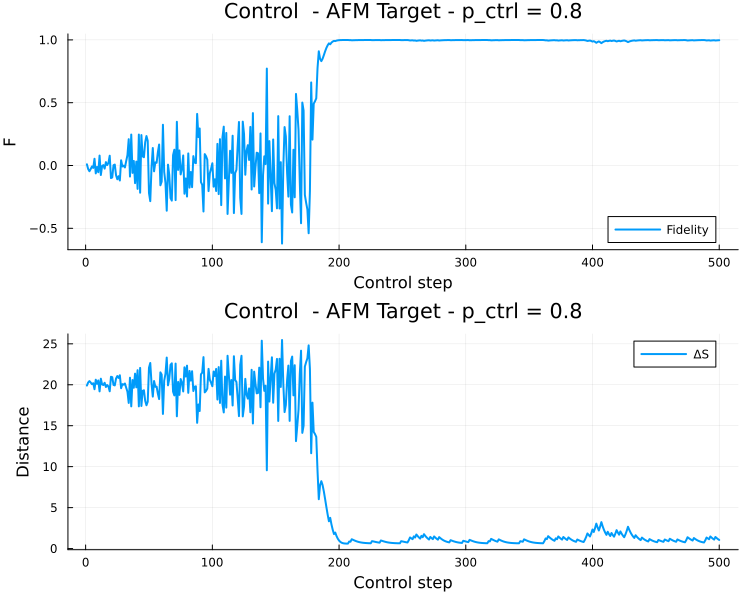

([0.009719928267830635, -0.02806770824728044, -0.04564064315301215, -0.02780013132000834, -0.007404879767819208, -0.0191901923360867, 0.05380682104312674, -0.06282632169997239, -0.0114550424458002, -0.05354090285803435  …  0.9961543973321304, 0.9967653555810152, 0.9945391479740566, 0.995543689688204, 0.9963648160024108, 0.9970074094576327, 0.9949946675354084, 0.9959240744155093, 0.996666071819163, 0.9972392079861369], [19.90254573309964, 20.278717247643492, 20.451296637318105, 20.276078749329546, 20.073894597449502, 20.190972523450114, 19.454476045706183, 20.618677021107768, 20.11420743177504, 20.528395130348684  …  1.2402592395773375, 1.1374794637064536, 1.4779528621233036, 1.335112734165213, 1.2058504638574603, 1.0940922559578583, 1.4149687704122864, 1.276860231206903, 1.1548042986090932, 1.0508655564047191])

In [38]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

function heisenberg_chaotic!(dS, S, p, t)
    N, Jx, Jy, Jz, h = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)

        neighbor_field = [
            Jx * (S_mat[1, im1] + S_mat[1, ip1]),
            Jy * (S_mat[2, im1] + S_mat[2, ip1]),
            Jz * (S_mat[3, im1] + S_mat[3, ip1])
        ]

        local_field = neighbor_field + h[i, :]

        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S, p_ctrl)
    S_proj = projector_afm_full(S)
    newS = 0.5 .* S .+ 0.5 .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl;
                     T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, Jx, Jy, Jz, h)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chaotic!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end

        
        if rand() < p_ctrl
            S_final = projector_afm_half(S_final)
        end

        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
Jx, Jy, Jz = 1.0, 1.0, 1.0  
h_strength = 1e-6
h = h_strength .* randn(N, 3)


S0 = randn(3, N)
for i in 1:N
    S0[:, i] ./= norm(S0[:, i])
end


S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, J, 0.8; T = 100.0, dt = 0.1, max_steps = 500)

Step 1 — Fidelity = 0.311117, Distance = 16.599794
Step 2 — Fidelity = -0.770426, Distance = 26.61147
Step 3 — Fidelity = -0.645164, Distance = 25.652791
Step 4 — Fidelity = 0.864012, Distance = 7.375321
Step 5 — Fidelity = -0.964702, Distance = 28.033563
Step 6 — Fidelity = -0.406384, Distance = 23.718211
Step 7 — Fidelity = -0.631259, Distance = 25.544147
Step 8 — Fidelity = -0.614126, Distance = 25.409655
Step 9 — Fidelity = -0.617592, Distance = 25.436918
Step 10 — Fidelity = -0.617125, Distance = 25.433246
Step 11 — Fidelity = -0.617219, Distance = 25.433988
Step 12 — Fidelity = -0.571792, Distance = 25.074223
Step 13 — Fidelity = 0.498415, Distance = 14.164527
Step 14 — Fidelity = -0.415678, Distance = 23.796456
Step 15 — Fidelity = -0.595121, Distance = 25.25962
Step 16 — Fidelity = -0.611645, Distance = 25.390119
Step 17 — Fidelity = -0.616476, Distance = 25.428142
Step 18 — Fidelity = -0.572966, Distance = 25.083592
Step 19 — Fidelity = 0.497951, Distance = 14.171084
Step 20 —

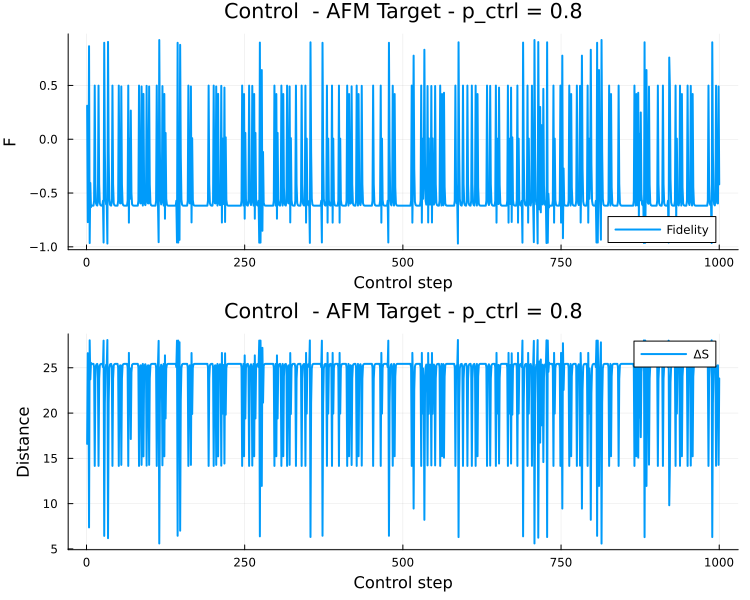

([0.31111707486336826, -0.7704258724433787, -0.6451641057235419, 0.8640116278584364, -0.9647015689595966, -0.4063838640771046, -0.6312585700009555, -0.6141264127488124, -0.6175919398799423, -0.6171250510332059  …  -0.5516394587282284, -0.605066324613607, -0.6149363387628514, -0.5746670770918486, 0.4972711291904996, -0.4162527932079687, -0.5952120716211602, -0.5962419845234495, 0.49018793209176886, -0.4191363124302106], [16.599794451062586, 26.611470476493412, 25.652790530193503, 7.375320567937026, 28.033562713070822, 23.718211374078646, 25.544146766541463, 25.409655077027864, 25.436917699123498, 25.43324647959903  …  24.912964285041223, 25.338242556913418, 25.4160292253046, 25.097148100279707, 14.180675353196378, 23.801284063891167, 25.260341143137207, 25.26849432839944, 14.280225219476645, 23.8255016899249])

In [ ]:
using DifferentialEquations
using LinearAlgebra
using Random
using Plots

gr(fmt = :png)

function heisenberg_chain!(dS, S, p, t)
    N, J = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))
    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)
        local_field = J * (S_mat[:, im1] + S_mat[:, ip1])
        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

function heisenberg_chaotic!(dS, S, p, t)
    N, Jx, Jy, Jz, h = p
    S_mat = reshape(S, (3, N))
    dS_mat = reshape(dS, (3, N))

    for i in 1:N
        ip1 = mod1(i + 1, N)
        im1 = mod1(i - 1, N)

        neighbor_field = [
            Jx * (S_mat[1, im1] + S_mat[1, ip1]),
            Jy * (S_mat[2, im1] + S_mat[2, ip1]),
            Jz * (S_mat[3, im1] + S_mat[3, ip1])
        ]

        local_field = neighbor_field + h[i, :]

        dS_mat[:, i] .= cross(S_mat[:, i], local_field)
    end
end

function fidelity(S1, S2)
    N = size(S1, 2)
    return sum(dot(S1[:, i], S2[:, i]) for i in 1:N) / N
end

function projector_afm_full(S)
    afm_proj = copy(S)
    for i in 1:size(S, 2)
        if isodd(i)
            afm_proj[:, i] = [0.0, 0.0, 1.0]
        else
            afm_proj[:, i] = [0.0, 0.0, -1.0]
        end
    end
    return afm_proj
end

function projector_afm_half(S, p_ctrl)
    S_proj = projector_afm_full(S)
    newS = 0.2 .* S + 0.8 .* S_proj
    for i in 1:size(S, 2)
        newS[:, i] ./= norm(newS[:, i])
    end
    return newS
end


function control_map(S_initial, S_target, N, J, p_ctrl; T = 100.0, dt = 0.1, max_steps = 100)

    tspan = (0.0, T)
    p = (N, Jx, Jy, Jz, h)
    S0_vec = vec(S_initial)

    F_list = Float64[]
    D_list = Float64[]

    for step in 1:max_steps
        prob = ODEProblem(heisenberg_chaotic!, S0_vec, tspan, p)
        sol = solve(prob, Tsit5(), reltol = 1e-6, abstol = 1e-6, saveat = dt)
        S_final = reshape(sol.u[end], (3, N))

        
        F = fidelity(S_final, S_target)
        D = norm(vec(S_final) - vec(S_target))

        push!(F_list, F)
        push!(D_list, D)

        println("Step $step — Fidelity = $(round(F, digits = 6)), Distance = $(round(D, digits = 6))")

       
        if F > 1 - 1e-8
            break
        end

        if rand() < p_ctrl
                S_final = projector_afm_half(S_final, p_ctrl)
            else
                S_final = S_final
        end
        
        
        S0_vec = vec(S_final)
    end

   
    plt1 = plot(F_list,
        lw = 2, label = "Fidelity", xlabel = "Control step", ylabel = "F",
        legend = :bottomright)
    plt2 = plot(D_list,
        lw = 2, label = "ΔS", xlabel = "Control step", ylabel = "Distance",
        legend = :topright)
    plt = plot(plt1, plt2, layout = (2, 1), size = (750, 600),
        title = "Control  - AFM Target - p_ctrl = $p_ctrl")
    display(plt)
    return F_list, D_list
end


N = 200
Jx, Jy, Jz = 1.0, 1.0, 1.0
h_strength = 0.001
h = h_strength .* randn(N, 3)


S0 = zeros(3, N)
for i in 1:N
    if isodd(i)
        S0[:, i] = [0.0, 0.0, 1.0]   
    else
        S0[:, i] = [0.0, 0.0, -1.0]  
    end
end


S_target = projector_afm_full(S0)

F_list, D_list = control_map(S0, S_target, N, (Jx, Jy, Jz), 0.8; T = 100.0, dt = 0.1, max_steps = 1000)